<a href="https://colab.research.google.com/github/Keshigami/500-AI-Machine-learning-Deep-learning-Computer-vision-NLP-Projects-with-code/blob/main/10_07_Object_Detection_with_YOLO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Object Detection with YOLO
- YOLO is short for You Only Look Once.
- It is a family of single-stage deep learning-based object detectors.
- They are capable of more than real-time object detection with state-of-the-art accuracy.

## Steps to  be followed:

1. Import the necessary libraries
2. Define the hyperparameter values
3. Define a helper function to download files
4. Pull the data from Roboflow
5. Clone the **YOLOv5** repository
6. Create a directory to store results
7. Run the model
8. Define a function to show validation predictions saved during training
9. Define a helper function for inference on images
10. Visualize inference images






### Step 1: Import the necessary libraries
- Import the **os** module for operating system-related functionalities.
- Import the **glob** module for file path pattern matching.
- Import the **matplotlib.pyplot** module for plotting.
- Import the **OpenCV** module for image processing.
- Import the **requests** module for making HTTP requests.


In [ ]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests

### Step 2: Define the hyperparameter values
- Define the number of epochs to train.

In [ ]:
TRAIN = True
EPOCHS = 5

__Observations:__

The code specifies that the training will be conducted over a total of 5 epochs.

### Step 3: Define a helper function to download files
- Download a file from the provided URL and save it with the specified name.
- Send an HTTP GET request to the URL to download the file.
- Write the content of the response to a file using the specified name.
- If the file already exists, display a message indicating that the download has been skipped.


In [ ]:
def download_file(url, save_name):
    if not os.path.exists(save_name):
        file = requests.get(url)
        open(save_name, 'wb').write(file.content)
    else:
        print('File already present, skipping download...')

### About the dataset:
- The dataset comprises images depicting different vehicles in diverse traffic conditions. These images have been sourced from the Open Image dataset.
- In total, the dataset consists of 5 classes, namely: Car, Bus, Motorcycle, Truck, and Ambulance.

### Step 4: Pull the data from Roboflow
Roboflow is an end-to-end computer vision platform that simplifies the process of building computer vision models.

-  If the **train** directory doesn't exist, download the dataset zip file from the specified URL using curl.
- Unzip the downloaded file and remove the zip file after extraction.
- Create a list of directory names: **train, valid, test**.
- Iterate over each directory name and its corresponding index.
- Get a sorted list of all image names in the current directory.
- Iterate over each image name and its corresponding index.
- If the index is even (i.e., every second image), extract the file name without the extension.
- Remove the image file.
- Remove the corresponding label file.


In [ ]:
if not os.path.exists('train'):

    !/usr/bin/curl -L "https://public.roboflow.com/ds/xKLV14HbTF?key=aJzo7msVta" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
    dirs = ['train', 'valid', 'test']
    for i, dir_name in enumerate(dirs):
        all_image_names = sorted(os.listdir(f"{dir_name}/images/"))
        for j, image_name in enumerate(all_image_names):
            if (j % 2) == 0:
                file_name = image_name.split('.jpg')[0]
                os.remove(f"{dir_name}/images/{image_name}")
                os.remove(f"{dir_name}/labels/{file_name}.txt")

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   902  100   902    0     0   3381      0 --:--:-- --:--:-- --:--:--  3378
100 38.4M  100 38.4M    0     0  38.9M      0 --:--:-- --:--:-- --:--:-- 38.9M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80.jpg  
 extracting: test/images/00dea1edf14f09ab_jpg.rf.KJ730oDTFPdXdJxvSLnX.jpg  
 extracting: test/images/00e481ea1a520175_jpg.rf.6e6a8b3b45c9a11d106958f88ff714ea.jpg  
 extracting: test/images/00e481ea1a520175_jpg.rf.MV6sZ8QCFwFeMYaI2tHm.jpg  
 extracting: test/images/08c8b73e0c2e296e_jpg.rf.7IkYAamjZhnwsoXSrwKt.jpg  
 extracting: test/images/08c8b73e0c2e296e_jpg.rf.effa65856584463c08848031cab357b9.jpg  
 extractin

**Observations:**

The code snippet downloads a dataset, extracts it, and selectively removes certain image and label files from the directories.

### Step 5: Clone the YOLOv5 repository
- If the **YOLOv5** directory does not exist, clone the **YOLOv5** repository from the provided GitHub URL.
- Change the current working directory to **YOLOv5**.
- Install the necessary Python packages listed in the **requirements.txt** file.


In [ ]:
if not os.path.exists('yolov5'):

    !git clone https://github.com/ultralytics/yolov5.git

%cd yolov5/

#Run it once, restart the session and then run the same code snippet with this command commented out.
!pip3 install -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 17533, done.
remote: Counting objects: 100% (31/31), done.
remote: Compressing objects: 100% (31/31), done.
remote: Total 17533 (delta 16), reused 0 (delta 0), pack-reused 17502 (from 5)
Receiving objects: 100% (17533/17533), 16.63 MiB | 30.68 MiB/s, done.
Resolving deltas: 100% (12012/12012), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 107.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 94.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s et

**Observations:**

The code block checks for the presence of the **YOLOv5** project directory, clones it (if necessary), sets it as the current working directory, and installs the required dependencies.

### Step 6: Create a directory to store results
- Set the directory to store results based on the current number of result directories.
- Count the number of result directories in the **runs/train** directory. If the **TRAIN** variable is **True** (assuming it's defined outside of this function), then set the result directory name with an incremented count.
- Otherwise, set the result directory name without incrementing the count.
- Return the name of the result directory.


In [ ]:
def set_res_dir():
    # Directory to store results
    res_dir_count = len(glob.glob('runs/train/*'))
    print(f"Current number of result directories: {res_dir_count}")
    if TRAIN:
        RES_DIR = f"results_{res_dir_count+1}"
    else:
        RES_DIR = f"results_{res_dir_count}"
    return RES_DIR

### Step 7: Run the model
- Set the **RES_DIR** variable by calling the **set_res_dir()** function.
- If the **TRAIN** variable is **True**, execute the **train.py** script with the specified command-line arguments.


In [ ]:
RES_DIR = set_res_dir()
print(RES_DIR)
if TRAIN:
    print(os.getcwd())
    # VOC: python3
    !python3 train.py --data ../data.yaml --weights yolov5m.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}

Current number of result directories: 0
results_1
/content/yolov5
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-08-17 05:33:23.585267: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1755408803.858991     990 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1755408803.936297     990 cuda_blas.cc:1407] Unable to register c

**Observations:**

The code sets a results directory using **set_res_dir()**. If **TRAIN** is **True**, it executes a **YOLOv5** training command with specific arguments, saving the results in the results directory.

### Step 8: Define a function to show validation predictions saved during training
- List the contents of the **runs/train/{RES_DIR}** directory.
- Set the **EXP_PATH** variable as the path to the result directory.
- Get a list of paths to predicted images in the result directory.
- Print the list of predicted image paths.
- Iterate over each predicted image path.
- Read the image using **OpenCV**.
- Create a figure with a specific size.
- Display the image (converting BGR to RGB) and turn off the axes.
- Show the image.


In [ ]:
def show_valid_results(RES_DIR):
    !ls runs/train/{RES_DIR}
    EXP_PATH = f"runs/train/{RES_DIR}"
    validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")
    print(validation_pred_images)
    for pred_image in validation_pred_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

### Step 9: Define a helper function for inference on images
- Perform inference on images using the specified result directory.
- Create a directory to store inference results.
- Count the number of inference-detection directories.
- Set the inference-detection directory name with an incremented count.
- Execute the **detect.py** script with the specified command-line arguments.
- Return the name of the inference detection directory.


In [ ]:
def inference(RES_DIR, data_path):

    infer_dir_count = len(glob.glob('runs/detect/*'))
    print(f"Current number of inference detection directories: {infer_dir_count}")
    INFER_DIR = f"inference_{infer_dir_count+1}"
    print(INFER_DIR)

    !python3 detect.py --weights runs/train/{RES_DIR}/weights/best.pt \
    --source {data_path} --name {INFER_DIR}
    return INFER_DIR

### Step 10: Visualize inference images
- Perform inference on images using the specified result directory.
- Create a directory to store inference results.
- Count the number of inference-detection directories.
- Set the inference detection directory name with an incremented count.
- Execute the **detect.py** script with the specified command-line arguments and return the name of the inference detection directory.



In [ ]:
def visualize(INFER_DIR):

    INFER_PATH = f"runs/detect/{INFER_DIR}"
    infer_images = glob.glob(f"{INFER_PATH}/*.jpg")
    print(infer_images)
    for pred_image in infer_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

confusion_matrix.png				   results.png
events.out.tfevents.1755408829.d38d5ca9f4b8.990.0  train_batch0.jpg
F1_curve.png					   train_batch1.jpg
hyp.yaml					   train_batch2.jpg
labels_correlogram.jpg				   val_batch0_labels.jpg
labels.jpg					   val_batch0_pred.jpg
opt.yaml					   val_batch1_labels.jpg
P_curve.png					   val_batch1_pred.jpg
PR_curve.png					   val_batch2_labels.jpg
R_curve.png					   val_batch2_pred.jpg
results.csv					   weights
['runs/train/results_1/val_batch2_pred.jpg', 'runs/train/results_1/val_batch0_pred.jpg', 'runs/train/results_1/val_batch1_pred.jpg']


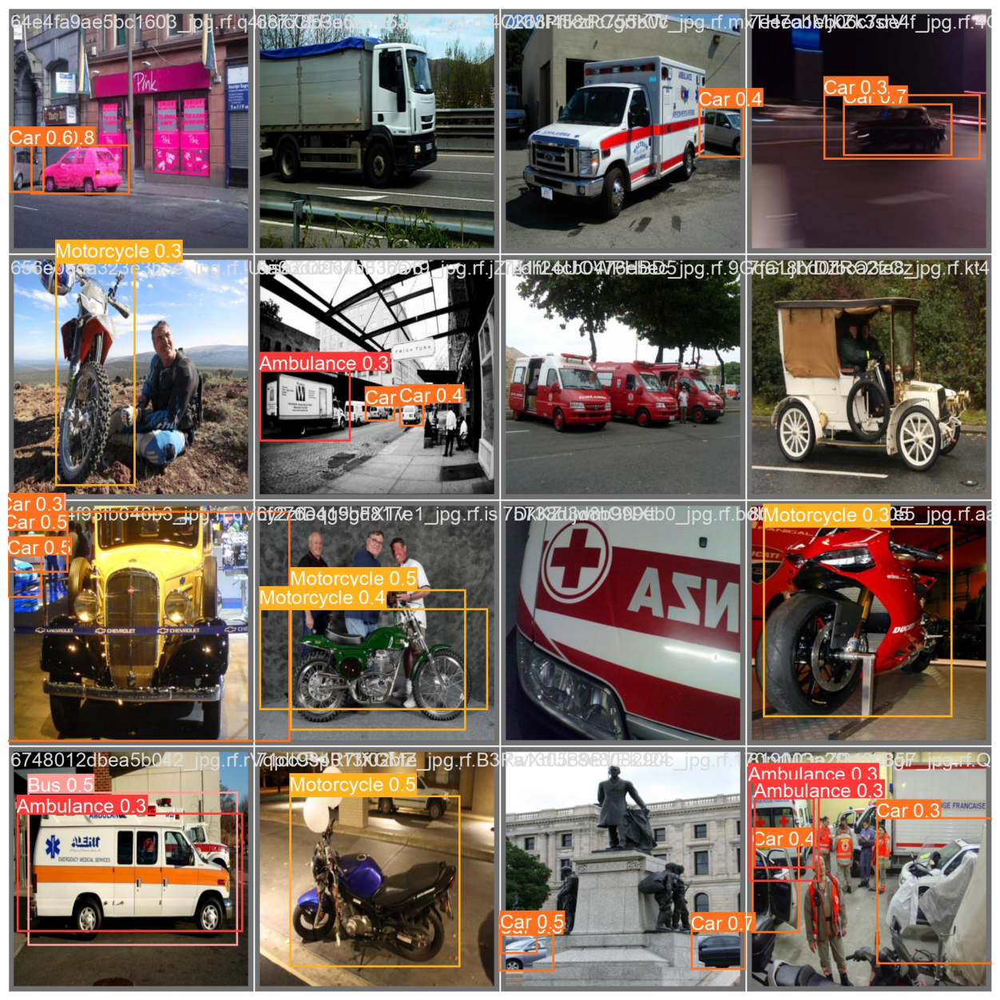

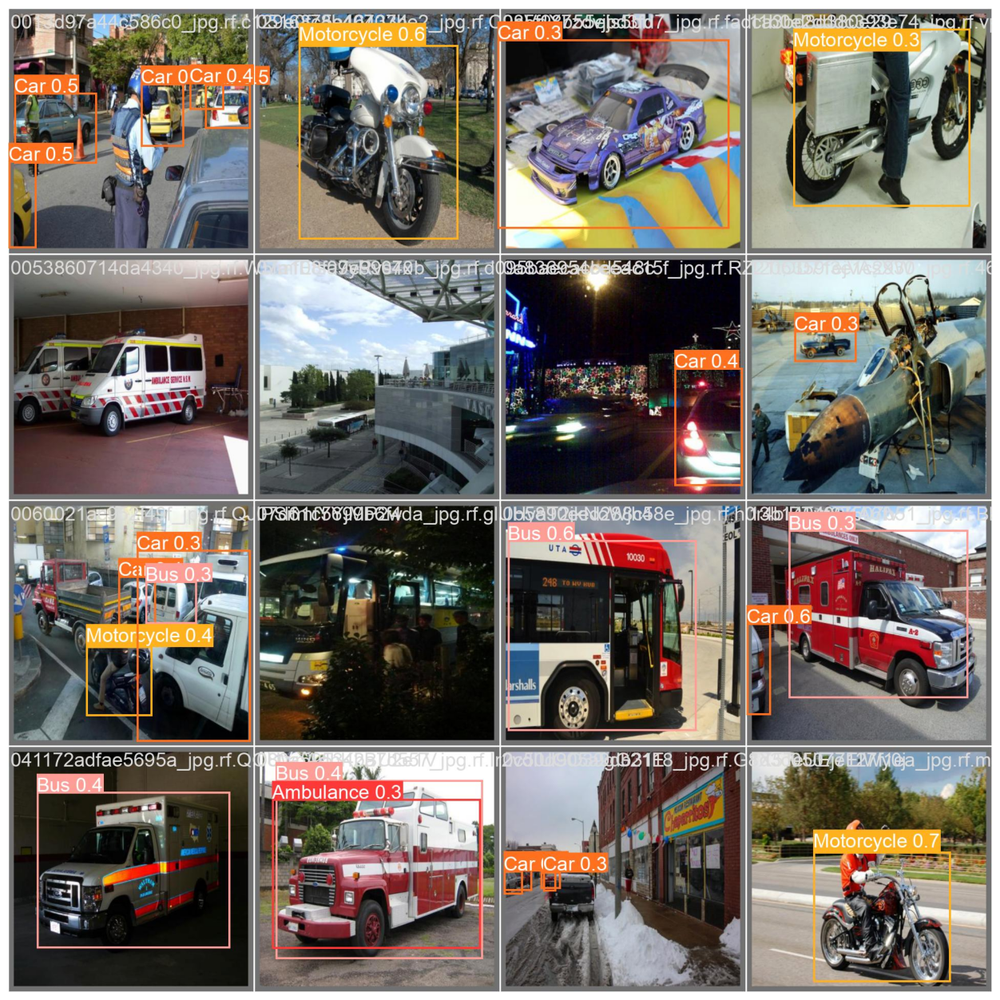

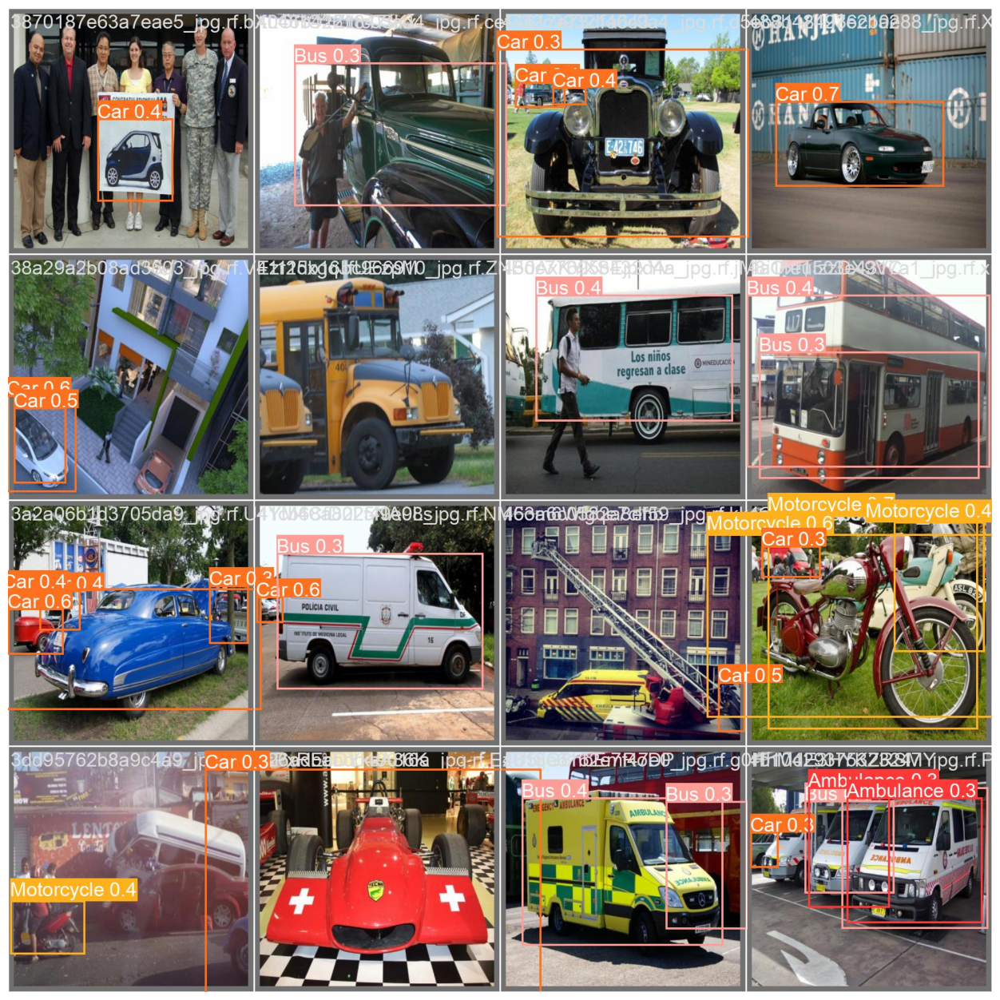

In [ ]:
show_valid_results(RES_DIR)

**Observations:**

The code defines a function that retrieves inference images from a specified directory. It loads and visualizes each image using OpenCV and Matplotlib, respectively, and displays them.

#### Download the inference data file
- If the **inference_images** directory doesn't exist, extract the contents of the **inference_data.zip** file.
- Else, print a message indicating that the dataset is already present.


In [ ]:
download_file('https://learnopencv.s3.us-west-2.amazonaws.com/yolov5_inference_data.zip',
              'inference_data.zip')
if not os.path.exists('inference_images'):
    !unzip -q "inference_data.zip"
else:
    print('Dataset already present')

#### Inference on images
- Call the **inference** function with the arguments **RES_DIR** and **inference_images**.
- Assign the output to the variable **IMAGE_INFER_DIR**.


In [ ]:
IMAGE_INFER_DIR = inference(RES_DIR, 'inference_images')

Current number of inference detection directories: 0
inference_1
detect: weights=['runs/train/results_1/weights/best.pt'], source=inference_images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_1, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-425-g85acef3a Python-3.11.13 torch-2.6.0+cu124 CPU

Traceback (most recent call last):
  File "/content/yolov5/detect.py", line 438, in <module>
    main(opt)
  File "/content/yolov5/detect.py", line 433, in main
    run(**vars(opt))
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/_contextlib.py", line 116, in decorate_context
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^

#### Visualizing the inference results
- Invoke the **visualize** function and pass the variable **IMAGE_INFER_DIR** as an argument.
- The visualize function displays the contents of the directory or file represented by the **IMAGE_INFER_DIR** variable.

In [ ]:
visualize(IMAGE_INFER_DIR)

[]


**Observations:**

 The content associated with the directory or file is displayed.